In [5]:
from astropy.table import Table
import numpy as np
from PIL import Image
import urllib, cStringIO
import matplotlib.gridspec as gridspec

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

In [3]:
def show_jpegs(gals, criteria_dict, num_gals=50, randomize=False):
    
    num = int(round(num_gals/5)*5)
    if num < num_gals: num+=5
    rows = num/5
    
    gs=gridspec.GridSpec(rows,5)
    gs.update(wspace=0.01)
    gs.update(hspace=0.01)
 
    if randomize:
        #shuffle which galaxies get displayed     
        n_list=np.linspace(0,len(gals)-1,len(gals))
        random.seed(3)
        random.shuffle(n_list)

        #how many galaxies to display?
        random_n_list = n_list[0:num]

        gal_list = []
        for n in random_n_list:
            gal_list.append(gals[int(n)])
    else:
        gal_list = gals
    
    if len(gal_list) > num:
        gal_list = gal_list[:num]
    
    labels = np.linspace(1,num,num)
    

    display_names = criteria_dict['labels']
    gz_col_names = criteria_dict['gzcolnames']
    values = criteria_dict['values']

    f=plt.figure(figsize=(30,rows*6))
    n=0
    for i in range (0,rows):
        for j in range(0,5):
            
            ax=plt.subplot(gs[i,j])
            
            try:
                gal = gal_list[n] 
            
                plt.imshow(get_image_from_url(gal['location']))
                plt.tick_params(labelbottom='off',labelleft='off')
            
                ax.annotate('$\mathrm{f_{%s}: %s}$'%(display_names[0],round(gal[gz_col_names[0]],2)),
                            fontsize=38,xy=(0.02,.97), xycoords='axes fraction',
                            verticalalignment='top',color='white')

                ax.annotate('$\mathrm{f_{%s}: %s}$'%(display_names[1], round(gal[gz_col_names[1]],2)),
                            fontsize=38,xy=(0.02,.02), xycoords='axes fraction',color='white')
                
                ax.annotate('%s'%int(labels[n]),fontsize=38,xy=(0.97,0.97),
                            xycoords='axes fraction',verticalalignment='top',
                            horizontalalignment='right',color='white')

                n+=1
            except:
                plt.tick_params(labelbottom='off',labelleft='off')

    f.text(.5,.92,'\n$f_{%s} > %s$~and~$f_{%s}>%s$'%(display_names[0], values[0], 
                                                     display_names[1], values[1]), fontsize=40, ha='center')

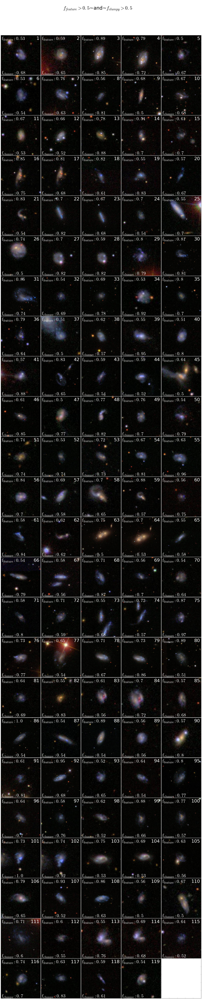

In [6]:
f_features = 't01_smooth_or_features_a02_features_or_disk_weighted_fraction'
f_clumpy = 't12_clumpy_a01_yes_weighted_fraction'

criteria_dict = {'labels':['feature', 'clumpy'], 'gzcolnames':[f_features, f_clumpy], 'values':[0.5, 0.5]}

single = Table.read('../data/gzh_sdss_strictclumpy_single.fits')
show_jpegs(single, criteria_dict, num_gals=len(single))